In [1]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import particle
import ROOT
import numpy as np
import sys
import pandas as pd
import glob
import numpy as np
import plotly.graph_objects as go
sys.path.append('/storage/gpfs_data/neutrino/users/gi/sand-physics/notebook/python_tools')
from ROOT_tools import ROOT_tools
from MultiPlotter import MultiPlotter
from ROOT2Pandas import Converter
from SampleManager import Sample, Manager
tool = ROOT_tools()

Welcome to JupyROOT 6.20/00


In [3]:
def GetLinePoints(vx, vy, vz, vtx, vty, vtz):
    x, y, z = ([] for i in range(3))
    
    # Normalize the direction vector
    norm = np.sqrt(vx**2 + vy**2 + vz**2)
    direction = np.array([vx / norm, vy / norm, vz / norm])
    
    start = np.array([vtx, vty, vtz])
    
    for i in np.arange(0, 4, 0.1):
        # Compute the point on the line at step i
        point = start + i * direction
        # Append the coordinates to the respective lists
        x.append(point[0])
        y.append(point[1])
        z.append(point[2])
    
    return {"x":x, "y":y,"z" : z}

def InteractionVolume_short(target):
    if("C3H6Target" in target):
        return "C3H6_Target"
    elif("CTarget" in target):
        return "C_Target"
    else:
        return "Other"



In [4]:
def intersect_with_inf_cylinder(vertex, direction, diameter):
    """
    Calculate the intersection between a line (starting at vertex, traveling in direction)
    and an infinite cylinder.
    
    Parameters:
    - vertex: numpy array (3,), the starting point of the particle [x, y, z].
    - direction: numpy array (3,), the direction of travel (should be normalized).
    - diameter: float, the diameter of the cylinder.
    
    Returns:
    - float, the smallest positive intersection distance along the direction, or np.inf if no valid intersection exists.
    """
    # Calculate relative position of vertex to the cylinder's center (assumed to be at origin in YZ plane)
    start_point = np.array([vertex[0], vertex[1] - -2384.73, vertex[2] - 23910.0])  # Adjust by center
    
    # Coefficients for the quadratic equation
    A = direction[1]**2 + direction[2]**2
    B = 2 * (start_point[1] * direction[1] + start_point[2] * direction[2])
    C = start_point[1]**2 + start_point[2]**2 - (diameter / 2.0)**2
    
    # Discriminant of the quadratic equation
    discriminant = B**2 - 4 * A * C
    
    if discriminant < 0:
        return np.inf  # No real intersection
    
    # Solutions to the quadratic equation
    t1 = (-B + np.sqrt(discriminant)) / (2 * A)
    t2 = (-B - np.sqrt(discriminant)) / (2 * A)
    
    # Return the smallest positive solution
    if t1 >= 0 and t2 >= 0:
        return min(t1, t2)
    elif t1 >= 0:
        return t1
    elif t2 >= 0:
        return t2
    else:
        return np.inf  # Both intersections are negative

def intersect_with_tube(vertex, direction, diameter, tube_length):
    """
    Compute the intersection of a line with a finite-length tube.
    
    Parameters:
    - vertex: numpy array (3,), the starting point of the particle [x, y, z].
    - direction: numpy array (3,), the direction of travel (should be normalized).
    - diameter: float, the diameter of the tube.
    - tube_length: float, the length of the tube along the X axis.
    
    Returns:
    - float, the distance to the intersection along the direction, or np.inf if no valid intersection exists.
    """
    
    # Get intersection with infinite cylinder
    t = intersect_with_inf_cylinder(vertex, direction, diameter)
    
    # Calculate the x-coordinate of the intersection
    intersection_x = vertex[0] + t * direction[0]
    
    # Check if the intersection point is within the tube's length
    if abs(intersection_x - 0.0) <= tube_length / 2.0:
        return t
    else:
        # Intersect with the ends of the tube (caps)
        t1 = (0.0 + tube_length / 2.0 - vertex[0]) / direction[0]
        t2 = (0.0 - tube_length / 2.0 - vertex[0]) / direction[0]
        
        if t1 >= 0 and t2 >= 0:
            return min(t1, t2)
        elif t1 >= 0:
            return t1
        elif t2 >= 0:
            return t2
        else:
            return np.inf  # No valid intersection

def get_expected_hit_position(vertex, momentum_vector, cell):
    """
    Computes expected hit positions in calorimeter cells based on particle's vertex and momentum.
    
    Parameters:
    - vertex: numpy array (3,), the starting point of the particle [x, y, z] in mm.
    - momentum_vector: numpy array (3,), the momentum direction vector of the particle.
    - cells: list of dictionaries, where each cell contains the 'z' coordinate of the cell center.
    
    Returns:
    - list of numpy arrays (3,), each representing the expected hit position in a cell.
      If the hit is not valid, the position is returned as [-999, -999, -999].
    """
    
    # Constants for the SAND geometry
    SAND_INNER_VOL_X_LENGTH = 3380.0  # in mm
    SAND_INNER_VOL_DIAMETER = 4000.0  # in mm
    thickness = 240  # mm
    DEFAULT_NO_DATA = -999  # Placeholder for invalid positions

    # Normalize momentum_vector to get neutron direction
    neutron_direction = momentum_vector / np.linalg.norm(momentum_vector)

    # Calculate minimum t (entry point in ECAL)
    min_t = intersect_with_tube(vertex, neutron_direction, SAND_INNER_VOL_DIAMETER, SAND_INNER_VOL_X_LENGTH)

    # Calculate maximum t (exit point in ECAL)
    max_t = intersect_with_tube(vertex, neutron_direction, 
                                SAND_INNER_VOL_DIAMETER + 2 * thickness, 
                                SAND_INNER_VOL_X_LENGTH + 2 * thickness)

    # Initialize the list of expected hit positions

    # Calculate t for the cell based on its z-coordinate
    t = (cell['Fired_Cells_z'] - vertex[2]) / neutron_direction[2]
    
    if min_t < t < max_t:  # If t is within the ECAL range
        # Compute the expected hit position
        return t
    else:
        # If t is outside the valid range, append the placeholder
        return DEFAULT_NO_DATA



In [5]:
def plot_SAND3D(fig, opacity=0.4):
    # Parametri del cilindro
    sand_radius = 2000  # Raggio del cilindro
    sand_length = 3300  # Lunghezza del cilindro lungo X
    sand_center = [0, -2384.73, 23910]  # Il centro del cilindro nel piano YZ
    
    # Genera i punti per la superficie laterale del cilindro
    theta = np.linspace(0, 2 * np.pi, 100)  # Angolo attorno al cilindro
    x_sand = np.linspace(-sand_length / 2, sand_length / 2, 50) + sand_center[0]  # Lunghezza cilindro (asse X)
    theta, x = np.meshgrid(theta, x_sand)  # Griglia 2D per la superficie laterale

    # Coordinate nel piano ZY per la superficie laterale
    z_sand = sand_radius * np.cos(theta) + sand_center[2]  # Coordinata Z della circonferenza del cilindro
    y_sand = sand_radius * np.sin(theta) + sand_center[1]  # Coordinata Y della circonferenza del cilindro

    # Genera i punti per i tappi (dischi) alle estremità
    theta_cap = np.linspace(0, 2 * np.pi, 100)  # Angolo per i tappi
    r_cap = np.linspace(0, sand_radius, 50)  # Raggio dei tappi
    theta_cap, r = np.meshgrid(theta_cap, r_cap)  # Griglia 2D per i tappi

    # Coordinate dei tappi nel piano ZY, con X fisso a +sand_length/2 e -sand_length/2
    x_cap_top = np.full_like(theta_cap, sand_length / 2) + sand_center[0]  # Tappo superiore, X fisso
    x_cap_bottom = np.full_like(theta_cap, -sand_length / 2) + sand_center[0]  # Tappo inferiore, X fisso

    # Coordinate ZY per i tappi (dischi)
    z_cap = r * np.cos(theta_cap) + sand_center[2]  # Coordinata Z per i tappi
    y_cap = r * np.sin(theta_cap) + sand_center[1]  # Coordinata Y per i tappi

    # Plotta la superficie laterale del cilindro
    fig.add_surface(x=x, y=z_sand, z=y_sand, colorscale='Blues', opacity=opacity, showscale=False)

    # Plotta il tappo superiore (a X = +sand_length/2)
    fig.add_surface(x=x_cap_top, y=z_cap, z=y_cap, colorscale='Blues', opacity=opacity, showscale=False)

    # Plotta il tappo inferiore (a X = -sand_length/2)
    fig.add_surface(x=x_cap_bottom, y=z_cap, z=y_cap, colorscale='Blues', opacity=opacity, showscale=False)

    # Imposta le etichette degli assi e il range, mantenendo il rapporto proporzionale tra gli assi
    fig.update_layout(
        scene=dict(
            xaxis_title='X',  # L'asse X rappresenta la lunghezza del cilindro
            yaxis_title='Z',  # L'asse Z rappresenta la circonferenza del cilindro nel piano ZY
            zaxis_title='Y',  # L'asse Y rappresenta la circonferenza del cilindro nel piano ZY
            aspectmode='manual',  # Mantenere il rapporto proporzionale tra gli assi
            aspectratio=dict(x=0.8, y=1, z=1),  # Regola il rapporto per rendere l'asse X più corto
            xaxis=dict(range=[-sand_length / 2 - 500, sand_length / 2 + 500]),  # Range asse X (lunghezza del cilindro)
            yaxis=dict(range=[sand_center[2] - sand_radius - 500, sand_center[2] + sand_radius + 500]),  # Range asse Z
            zaxis=dict(range=[sand_center[1] - sand_radius - 500, sand_center[1] + sand_radius + 500])  # Range asse Y
        ),
        width=800,
        height=600
    )

# # Crea una figura Plotly
# fig = go.Figure()

# # Chiama la funzione per plottare il cilindro 3D
# plot_SAND3D(fig)

# # Mostra la figura
# fig.show()


In [6]:
def plot_track3D(fig, vector_x, vector_y, vector_z, label = '', color = 'blue', style = 'dash', line_width=3):
    fig.add_trace(go.Scatter3d(
        x = vector_x, 
        y = vector_z, 
        z = vector_y,
        mode='lines', 
        name=label, 
        line=dict(color=color, 
                  dash=style, 
                  width=line_width)  # Aggiunto il parametro width
    ))

def plot_points3D(fig, vector_x, vector_y, vector_z, label = '', color = 'blue', symbol = 'cross', size = 5):
    fig.add_trace(go.Scatter3d(
    x=vector_x, 
    y=vector_y, 
    z=vector_z,
    mode='markers',  # Cambia da 'lines' a 'markers'
    name=label, 
    marker=dict(
        color=color,
        symbol=symbol,  # Imposta il simbolo come croce
        size=size,  # Imposta la dimensione dei marker
        line=dict(width=2, color=color),
        opacity=0.8
    )
))

In [7]:
sand_center = [0, -2384.73, 23910]
sand_radius = 2000
theta = np.linspace(0, 2*np.pi, 100000)
z_sand = sand_center[2] + sand_radius * np.cos(theta)
y_sand = sand_center[1] + sand_radius * np.sin(theta)

def plot_SAND(ax):
    
    ax[0].plot(z_sand, y_sand, linestyle='-', color='red', label = 'SAND inner volume')

    ax[1].vlines(sand_center[2] - sand_radius, -1650, 1650, color='red', label='SAND inner volume')
    ax[1].vlines(sand_center[2] + sand_radius, -1650, 1650, color='red')
    ax[1].hlines(-1650, sand_center[2] - sand_radius, sand_center[2] + sand_radius, color='red')
    ax[1].hlines(1650,  sand_center[2] - sand_radius, sand_center[2] + sand_radius,color='red')

In [8]:
def GetExpectedTrajectory(vtx, direction, nof_points = 5000):
    direction = direction / np.sqrt(direction[0]**2 + direction[1]**2 + direction[2]**2)
    x,y,z = [],[],[]
    for i in range(nof_points):
        x.append(vtx[0] + i*direction[0])
        y.append(vtx[1] + i*direction[1])
        z.append(vtx[2] + i*direction[2])
    return {"x":x,"y":y,"z":z}

In [9]:
def plot_event3D(df, trajectories, fired_cells, event_name:str, plot_hit_reco = True, plot_hit_true = False):
    event = df.loc[event_name]
    print("Calculate expected neutron")
    expected_neutron =GetExpectedTrajectory([event.Interaction_vtxX * 1e3, event.Interaction_vtxY * 1e3, event.Interaction_vtxZ * 1e3],
                      [event.ExpectedHadronSystP3fX, event.ExpectedHadronSystP3fY, event.ExpectedHadronSystP3fZ])
    print("read event trajectories")
    event_trajectory = trajectories.loc[event_name]
    print("read fired wires")
    event_fired_cells = fired_cells.loc[event_name]
    neutron_trj = event_trajectory.query("pdg == 2112")
    antimu_trj = event_trajectory.query("pdg == -13")
    # antimu_cells = event_fired_cells.query('Fired_by_primary_antimu==1')
    # neutron_cells = event_fired_cells.query('Fired_by_primary_neutron==1')
    compatible_cell = event_fired_cells.query("IsCompatible==1")

    track_ids_event = event_trajectory.trackid.unique()
    labels = {2112:"neutron", 22:"gamma", -13:"antimuons"}
    colors = {2112:"blue", 22:"violet", -13:"green"}

    print(event)

    # Crea il grafico interattivo con Plotly
    fig = go.Figure()

    for track_id in track_ids_event[track_ids_event!=-999]:

        plot_track3D(fig, event_trajectory.query(f"trackid == {track_id}").point_x, 
                          event_trajectory.query(f"trackid == {track_id}").point_y, 
                          event_trajectory.query(f"trackid == {track_id}").point_z, 
                          label=labels[event_trajectory.query(f"trackid == {track_id}")['pdg'][0]],
                          color=colors[event_trajectory.query(f"trackid == {track_id}")['pdg'][0]],
                          style='solid',
                          line_width=5)

    plot_track3D(fig, expected_neutron['x'], 
                      expected_neutron['y'], 
                      expected_neutron['z'], 
                      label="predicted neutron",
                      color='blue',
                      style='dash',
                      line_width=5)

    # plot_track3D(fig, antimu_trj.point_x, 
    #                   antimu_trj.point_y, 
    #                   antimu_trj.point_z, 
    #                   label="true antimu",
    #                   color='green',
    #                   style='solid',
    #                   line_width=5)

    plot_points3D(fig, event_fired_cells.ExpectedNeutron_HitPosition_x,
                       event_fired_cells.ExpectedNeutron_HitPosition_z,
                       event_fired_cells.ExpectedNeutron_HitPosition_y,
                       label='predicted hits',
                       color='blue',
                       size = 8)
    if(plot_hit_reco==1):
        plot_points3D(fig, event_fired_cells.Reconstructed_HitPosition_x,
                           event_fired_cells.Reconstructed_HitPosition_z,
                           event_fired_cells.Reconstructed_HitPosition_y,
                           label='ECAL hit reco',
                           color='orange',
                           size = 8)
    
    if(plot_hit_true == True):
        plot_points3D(fig, event_fired_cells.Fired_Cell_true_Hit_x,
                           event_fired_cells.Fired_Cell_true_Hit_z,
                           event_fired_cells.Fired_Cell_true_Hit_y,
                           label='ECAL hit true',
                           color='violet',
                           size = 8)

    plot_points3D(fig, compatible_cell.Reconstructed_HitPosition_x,
                       compatible_cell.Reconstructed_HitPosition_z,
                       compatible_cell.Reconstructed_HitPosition_y,
                       label='compatible cell',
                       color='red',
                       size = 8)

    plot_SAND3D(fig)

    # fig.write_html('grafico_interattivo.html')

    fig.update_layout(
        width=1e3,  # Imposta la larghezza
        height=1e3  # Imposta l'altezza
    )
    fig.show()

    # print(f"space residuals candidate cells {candidate_cell.Residuals_HitSpace.values}, time residuals {candidate_cell.Residuals_HitTime.values}")

In [10]:
folder = "/storage/gpfs_data/neutrino/users/gi/sand-physics/production_antinumucc/FV_Signal"
production = glob.glob(f"{folder}/*analysed.root")
trajectories = glob.glob(f"{folder}/*analysed.trj.root")
trajectories

['/storage/gpfs_data/neutrino/users/gi/sand-physics/production_antinumucc/FV_Signal/events-in-SANDtracker.200.to.300.ecal-digit.analysed.trj.root',
 '/storage/gpfs_data/neutrino/users/gi/sand-physics/production_antinumucc/FV_Signal/events-in-SANDtracker.300.to.400.ecal-digit.analysed.trj.root',
 '/storage/gpfs_data/neutrino/users/gi/sand-physics/production_antinumucc/FV_Signal/events-in-SANDtracker.900.to.1000.ecal-digit.analysed.trj.root',
 '/storage/gpfs_data/neutrino/users/gi/sand-physics/production_antinumucc/FV_Signal/events-in-SANDtracker.600.to.700.ecal-digit.analysed.trj.root',
 '/storage/gpfs_data/neutrino/users/gi/sand-physics/production_antinumucc/FV_Signal/events-in-SANDtracker.700.to.800.ecal-digit.analysed.trj.root',
 '/storage/gpfs_data/neutrino/users/gi/sand-physics/production_antinumucc/FV_Signal/events-in-SANDtracker.400.to.500.ecal-digit.analysed.trj.root',
 '/storage/gpfs_data/neutrino/users/gi/sand-physics/production_antinumucc/FV_Signal/events-in-SANDtracker.100.t

In [11]:
# file_trajectories =  trajectories[0]
file_trajectories =   '/storage/gpfs_data/neutrino/users/gi/sand-physics/production_antinumucc/FV_Signal/events-in-SANDtracker.0.to.100.ecal-digit.analysed.trj.root'
file_trajectories

'/storage/gpfs_data/neutrino/users/gi/sand-physics/production_antinumucc/FV_Signal/events-in-SANDtracker.0.to.100.ecal-digit.analysed.trj.root'

In [12]:
# file_production = production[1]
file_production = '/storage/gpfs_data/neutrino/users/gi/sand-physics/production_antinumucc/FV_Signal/events-in-SANDtracker.0.to.100.ecal-digit.analysed.root'
file_production

'/storage/gpfs_data/neutrino/users/gi/sand-physics/production_antinumucc/FV_Signal/events-in-SANDtracker.0.to.100.ecal-digit.analysed.root'

In [13]:
columns_df = ['FileName',
              'EventType',
              'CCQEonHydrogen',
              'Interaction_vtxX',
              'Interaction_vtxY',
              'Interaction_vtxZ',
              'InteractionTarget',
              'InteractionVolume_short',
              'PrimaryStateHadronicSystemTopology_name',
              'NofFinalStateChargedParticles',
              'MissingTransverseMomentum',
              'ExpectedHadronSystP3',
 ]

columns_primaries = ['FileName',
                      'EventType',
                      'CCQEonHydrogen',
                      'Interaction_vtxX',
                      'Interaction_vtxY',
                      'Interaction_vtxZ',
                      'Interaction_vtxT',
                      'PrimariesPDG',
                      'PrimariesTrackId',
                      'PrimariesP4',
                      'PrimariesBeta',
                      # "ExpectedNeutron_Beta",
                      'PrimariesEDepECAL',
                      'PrimariesEmissionAngle',
                      'DeviationAngle',
                      ]

columns_fired_cells = ['FileName',
                       'CCQEonHydrogen',
                       'Interaction_vtxX',
                       'Interaction_vtxY',
                       'Interaction_vtxZ',
                       'Interaction_vtxT',
                       'Fired_Cells_mod',
                       'Fired_Cells_id',
                       'Fired_Cells_x',
                       'Fired_Cells_y',
                       'Fired_Cells_z',
                       'isCellComplete',
                       'Fired_Cells_adc1',
                       'Fired_Cells_tdc1',
                       'Fired_Cells_adc2',
                       'Fired_Cells_tdc2',
                       'Fired_Cell_true_hit1',
                       'Fired_Cell_true_hit2',
                        "Fired_by_primary_neutron",
                        "Fired_by_primary_antimu",
                        "Fired_Cell_true_Hit_x",
                        "Fired_Cell_true_Hit_y",
                        "Fired_Cell_true_Hit_z",
                        "Fired_Cell_true_Hit_t",
                        "ExpectedNeutron_HitPosition_x",
                        "ExpectedNeutron_HitPosition_y",
                        "ExpectedNeutron_HitPosition_z",
                        # "ExpectedNeutron_TOF",
                        "Reconstructed_HitPosition_x",
                        "Reconstructed_HitPosition_y",
                        "Reconstructed_HitPosition_z",
                        # "Reconstructed_HitPoistion_w",
                        "Reconstructed_Energy",
                        # "Reconstructed_HitTime",
                    #     "ExpectedNeutron_Beta",
                        # "True_FlightLength",
                        # "ExpectedNeutron_FlightLength",
                        # "Reconstructed_FlightLength",
                        #
                        # "Residuals_HitTime",
                        # "Residuals_HitSpace",
                        "IsCompatible",
                        # "isCandidate",
                        # "Reconstructed_MissingPT",
                        ]

columns_trj = [
     "FileName",
     "trackid",
     "pdg",
     "point_x",
     "point_y",
     "point_z",
     "point_px",
     "point_py",
     "point_pz",
     "process",
]

In [14]:
converter_trj = Converter([file_trajectories], "trj_extended")
converter = Converter([file_production], "digit_extended")

In [15]:
primaries = converter.CreatePandas(
    columns = columns_primaries,
    rename = True,
    indices = ['FileName', 'PrimariesTrackId']
)
primaries

DataFrame from file /storage/gpfs_data/neutrino/users/gi/sand-physics/production_antinumucc/FV_Signal/events-in-SANDtracker.0.to.100.ecal-digit.analysed.root has MultiIndex structure, keeping entry and subentry as columns


entry  \
FileName                                           PrimariesTrackId subentry          
events-in-SANDtracker.31.gtrac.root:gRooTracker:30 0                0             0   
                                                   1                1             0   
events-in-SANDtracker.31.gtrac.root:gRooTracker:59 0                0             1   
                                                   1                1             1   
events-in-SANDtracker.31.gtrac.root:gRooTracker:77 0                0             2   
...                                                                             ...   
events-in-SANDtracker.99.gtrac.root:gRooTracker... 1                1          2909   
events-in-SANDtracker.99.gtrac.root:gRooTracker... 0                0          2910   
                                                   1                1          2910   
events-in-SANDtracker.99.gtrac.root:gRooTracker... 0                0          2911   
                                                   1                1          2911   

                                                                             EventType  \
FileName                                           PrimariesTrackId subentry             
events-in-SANDtracker.31.gtrac.root:gRooTracker:30 0                0              QES   
                                                   1                1              QES   
events-in-SANDtracker.31.gtrac.root:gRooTracker:59 0                0              QES   
                                                   1                1              QES   
events-in-SANDtracker.31.gtrac.root:gRooTracker:77 0                0              QES   
...                                                                                ...   
events-in-SANDtracker.99.gtrac.root:gRooTracker... 1                1              QES   
events-in-SANDtracker.99.gtrac.root:gRooTracker... 0                0              QES   
                                                   1                1              QES   
events-in-SANDtracker.99.gtrac.root:gRooTracker... 0                0              QES   
                                                   1                1              QES   

                                                                              CCQEonHydrogen  \
FileName                                           PrimariesTrackId subentry                   
events-in-SANDtracker.31.gtrac.root:gRooTracker:30 0                0                      1   
                                                   1                1                      1   
events-in-SANDtracker.31.gtrac.root:gRooTracker:59 0                0                      1   
                                                   1                1                      1   
events-in-SANDtracker.31.gtrac.root:gRooTracker:77 0                0                      1   
...                                                                                      ...   
events-in-SANDtracker.99.gtrac.root:gRooTracker... 1                1                      1   
events-in-SANDtracker.99.gtrac.root:gRooTracker... 0                0                      1   
                                                   1                1                      1   
events-in-SANDtracker.99.gtrac.root:gRooTracker... 0                0                      1   
                                                   1                1                      1   

                                                                              Interaction_vtxX  \
FileName                                           PrimariesTrackId subentry                     
events-in-SANDtracker.31.gtrac.root:gRooTracker:30 0                0                 0.759969   
                                                   1                1                 0.759969   
events-in-SANDtracker.31.gtrac.root:gRooTracker:59 0                0                -0.446955   
                                    

In [16]:
df = converter.CreatePandas(
    columns = columns_df,
    rename = False,
    indices = ['FileName']
)
df

,EventType,CCQEonHydrogen,Interaction_vtxX,Interaction_vtxY,Interaction_vtxZ,InteractionTarget,InteractionVolume_short,PrimaryStateHadronicSystemTopology_name,NofFinalStateChargedParticles,MissingTransverseMomentum,ExpectedHadronSystP3fX,ExpectedHadronSystP3fY,ExpectedHadronSystP3fZ
FileName,,,,,,,,,,,,,
events-in-SANDtracker.31.gtrac.root:gRooTracker:30,QES,1,0.759969,-0.920575,24.193838,proton,C3H6_Target,n,1,7.027150e-16,-0.245146,-0.717702,0.267694
events-in-SANDtracker.31.gtrac.root:gRooTracker:59,QES,1,-0.446955,-4.109318,24.019382,proton,C3H6_Target,n,1,2.775558e-16,0.054413,0.614517,0.442417
events-in-SANDtracker.31.gtrac.root:gRooTracker:77,QES,1,0.754867,-0.947707,23.759441,proton,C3H6_Target,n,1,3.973994e-16,-0.631176,-0.109432,0.278100
events-in-SANDtracker.31.gtrac.root:gRooTracker:124,QES,1,-1.273559,-2.072076,25.686457,proton,C3H6_Target,n,1,2.224779e-16,-0.318249,-0.080716,0.085631
events-in-SANDtracker.31.gtrac.root:gRooTracker:126,QES,1,1.477474,-3.225315,23.427515,proton,C3H6_Target,n,1,5.551115e-16,-0.690593,-0.196537,0.408633
...,...,...,...,...,...,...,...,...,...,...,...,...,...
events-in-SANDtracker.99.gtrac.root:gRooTracker:915,QES,1,-0.844594,-4.198967,24.019769,proton,C3H6_Target,n,1,0.000000e+00,-0.473703,0.633240,0.595262
events-in-SANDtracker.99.gtrac.root:gRooTracker:937,QES,1,0.857920,-3.798519,23.136239,proton,C3H6_Target,n,1,6.701783e-16,-0.143269,0.032461,0.020699
events-in-SANDtracker.99.gtrac.root:gRooTracker:957,QES,1,0.365690,-0.748242,23.290128,proton,C3H6_Target,n,1,3.521884e-16,-0.051064,-0.011031,0.004465


In [17]:
fired_cells = converter.CreatePandas(
    columns = columns_fired_cells,
    rename = True,
    indices = ['FileName','Fired_Cells_id']
)
fired_cells

DataFrame from file /storage/gpfs_data/neutrino/users/gi/sand-physics/production_antinumucc/FV_Signal/events-in-SANDtracker.0.to.100.ecal-digit.analysed.root has MultiIndex structure, keeping entry and subentry as columns


entry  \
FileName                                           Fired_Cells_id subentry          
events-in-SANDtracker.31.gtrac.root:gRooTracker:30 221007         0             0   
                                                   221008         1             0   
                                                   221106         2             0   
                                                   221205         3             0   
                                                   221206         4             0   
...                                                                           ...   
events-in-SANDtracker.99.gtrac.root:gRooTracker... 215203         4          2911   
                                                   215302         5          2911   
                                                   215303         6          2911   
                                                   215403         7          2911   
                                                   215404         8          2911   

                                                                            CCQEonHydrogen  \
FileName                                           Fired_Cells_id subentry                   
events-in-SANDtracker.31.gtrac.root:gRooTracker:30 221007         0                      1   
                                                   221008         1                      1   
                                                   221106         2                      1   
                                                   221205         3                      1   
                                                   221206         4                      1   
...                                                                                    ...   
events-in-SANDtracker.99.gtrac.root:gRooTracker... 215203         4                      1   
                                                   215302         5                      1   
                                                   215303         6                      1   
                                                   215403         7                      1   
                                                   215404         8                      1   

                                                                            Interaction_vtxX  \
FileName                                           Fired_Cells_id subentry                     
events-in-SANDtracker.31.gtrac.root:gRooTracker:30 221007         0                 0.759969   
                                                   221008         1                 0.759969   
                                                   221106         2                 0.759969   
                                                   221205         3                 0.759969   
                                                   221206         4                 0.759969   
...                                                                                      ...   
events-in-SANDtracker.99.gtrac.root:gRooTracker... 215203         4                -0.012243   
                                                   215302         5                -0.012243   
                                                   215303         6                -0.012243   
                                                   215403         7                -0.012243   
                                                   215404         8                -0.012243   

                                                                            Interaction_vtxY  \
FileName                                           Fired_Cells_id subentry                     
events-in-SANDtracker.31.gtrac.root:gRooTracker:30 221007         0                -0.920575   
                                                   221008         1                -0.920575   
                                                   221106         2                -0.920575   
                  

In [18]:
trajectories = converter_trj.CreatePandas(
    columns = columns_trj,
    rename = False,
    indices = ['FileName']
)
trajectories

,trackid,pdg,point_x,point_y,point_z,point_px,point_py,point_pz,process
FileName,,,,,,,,,
events-in-SANDtracker.0.gtrac.root:gRooTracker:17,0,-13,-616.879312,-3338.928455,23865.542292,452.879496,154.096402,3651.956936,1.0
events-in-SANDtracker.0.gtrac.root:gRooTracker:17,0,-13,-585.302833,-3326.406984,24121.100000,447.203779,202.218199,3643.085068,1.0
events-in-SANDtracker.0.gtrac.root:gRooTracker:17,0,-13,-550.371585,-3308.863184,24405.520000,445.255234,242.586586,3632.266084,1.0
events-in-SANDtracker.0.gtrac.root:gRooTracker:17,0,-13,-518.190393,-3289.799529,24666.120000,447.135666,288.571320,3620.328165,1.0
events-in-SANDtracker.0.gtrac.root:gRooTracker:17,0,-13,-488.059006,-3268.710031,24910.440000,443.073741,335.051770,3609.836390,1.0
...,...,...,...,...,...,...,...,...,...
events-in-SANDtracker.97.gtrac.root:gRooTracker:952,0,-13,39.397386,-372.614794,30501.972366,-7.421239,45.224489,90.848697,2.0
events-in-SANDtracker.97.gtrac.root:gRooTracker:952,0,-13,40.350952,-360.256771,30530.222296,-0.180194,13.898346,40.197970,2.0
events-in-SANDtracker.97.gtrac.root:gRooTracker:952,0,-13,40.286019,-359.591585,30532.248504,-0.000000,-0.000000,0.000000,2.0


In [19]:
df_manager = Manager(df, "df", reference_index="FileName")
# primaries_manager = Manager(primaries, "primaries", reference_index="FileName")
fired_cells_manager = Manager(fired_cells, "fired_cells", reference_index="FileName")

In [38]:
df_manager.DefineSample("signal", "CCQEonHydrogen==1")
df_manager.DefineSample("true_positive", "CCQEonHydrogen==1 & event_has_candidate==1")
df_manager.DefineSample("false_positive", "CCQEonHydrogen==0 & event_has_candidate==1")
df_manager.DefineSample("true_negative", "CCQEonHydrogen==0 & event_has_candidate==0")
df_manager.DefineSample("false_negative", "CCQEonHydrogen==1 & event_has_candidate==0")

UndefinedVariableError: name 'event_has_candidate' is not defined

In [21]:
events_true_positive                       = df_manager.GetSample("true_positive")
events_false_positive                       = df_manager.GetSample("false_positive")
events_false_positive                       = df_manager.GetSample("false_positive") 
events_false_negative                       = df_manager.GetSample("false_negative") 

(array([4., 7., 9., 5., 4., 5., 3., 7., 2., 5.]),
 array([  2.42264911,  14.13678318,  25.85091726,  37.56505133,
         49.2791854 ,  60.99331947,  72.70745354,  84.42158761,
         96.13572168, 107.84985575, 119.56398982]),
 <BarContainer object of 10 artists>)

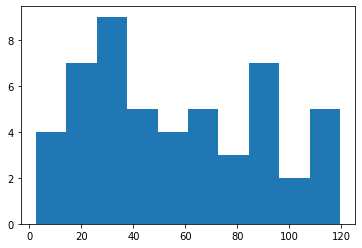

In [22]:
plt.hist(fired_cells.query("isCandidate==1").loc[events_true_positive.dataframe.index.get_level_values(0)].Residuals_HitSpace)

(array([6., 6., 2., 2., 6., 5., 3., 5., 1., 6.]),
 array([ 23.90234066,  33.42459203,  42.94684341,  52.46909479,
         61.99134617,  71.51359754,  81.03584892,  90.5581003 ,
        100.08035168, 109.60260305, 119.12485443]),
 <BarContainer object of 10 artists>)

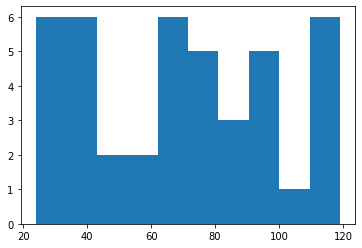

In [23]:
plt.hist(fired_cells.query("isCandidate==1").loc[events_false_positive.dataframe.index.get_level_values(0)].Residuals_HitSpace)

# Investigate False positives: background events w candiate cells

(array([ 0.,  0.,  0.,  0.,  0., 55.,  0.,  0.,  0.,  0.]),
 array([-0.5, -0.4, -0.3, -0.2, -0.1,  0. ,  0.1,  0.2,  0.3,  0.4,  0.5]),
 <BarContainer object of 10 artists>)

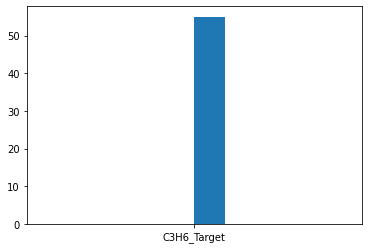

In [28]:
plt.hist(events_false_positive.dataframe.InteractionVolume_short)

(array([43.,  0.,  0.,  0.,  0.,  9.,  0.,  0.,  0.,  3.]),
 array([0. , 0.2, 0.4, 0.6, 0.8, 1. , 1.2, 1.4, 1.6, 1.8, 2. ]),
 <BarContainer object of 10 artists>)

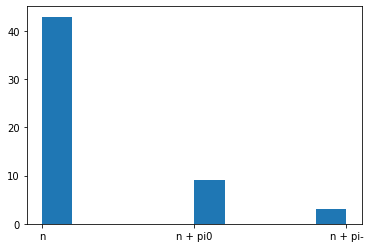

In [29]:
plt.hist(events_false_positive.dataframe.PrimaryStateHadronicSystemTopology_name)

(array([43.,  0.,  0.,  0.,  0.,  8.,  0.,  0.,  0.,  4.]),
 array([0. , 0.2, 0.4, 0.6, 0.8, 1. , 1.2, 1.4, 1.6, 1.8, 2. ]),
 <BarContainer object of 10 artists>)

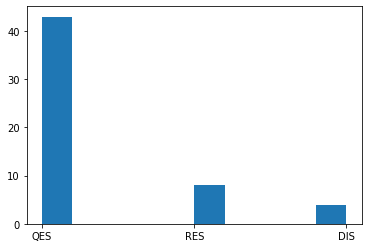

In [30]:
plt.hist(events_false_positive.dataframe.EventType)

In [119]:
events_false_positive.dataframe.index

Index(['events-in-SANDtracker.100.gtrac.root:gRooTracker:102',
       'events-in-SANDtracker.100.gtrac.root:gRooTracker:218',
       'events-in-SANDtracker.100.gtrac.root:gRooTracker:731',
       'events-in-SANDtracker.100.gtrac.root:gRooTracker:866',
       'events-in-SANDtracker.100.gtrac.root:gRooTracker:874',
       'events-in-SANDtracker.100.gtrac.root:gRooTracker:900',
       'events-in-SANDtracker.100.gtrac.root:gRooTracker:958',
       'events-in-SANDtracker.102.gtrac.root:gRooTracker:276',
       'events-in-SANDtracker.102.gtrac.root:gRooTracker:538',
       'events-in-SANDtracker.102.gtrac.root:gRooTracker:598',
       ...
       'events-in-SANDtracker.194.gtrac.root:gRooTracker:636',
       'events-in-SANDtracker.194.gtrac.root:gRooTracker:651',
       'events-in-SANDtracker.195.gtrac.root:gRooTracker:230',
       'events-in-SANDtracker.195.gtrac.root:gRooTracker:532',
       'events-in-SANDtracker.196.gtrac.root:gRooTracker:639',
       'events-in-SANDtracker.197.gtrac.root

In [42]:
df

,CCQEonHydrogen
FileName,
events-in-SANDtracker.62.gtrac.root:gRooTracker:13,1
events-in-SANDtracker.62.gtrac.root:gRooTracker:28,1
events-in-SANDtracker.62.gtrac.root:gRooTracker:38,1
events-in-SANDtracker.62.gtrac.root:gRooTracker:54,1
events-in-SANDtracker.62.gtrac.root:gRooTracker:106,1
...,...
events-in-SANDtracker.24.gtrac.root:gRooTracker:785,1
events-in-SANDtracker.24.gtrac.root:gRooTracker:823,1
events-in-SANDtracker.24.gtrac.root:gRooTracker:880,1


In [21]:
plot_event3D(df=df, trajectories=trajectories, fired_cells=fired_cells, 
             event_name='events-in-SANDtracker.0.gtrac.root:gRooTracker:348', plot_hit_reco=False, plot_hit_true=True)

Calculate expected neutron
read event trajectories
read fired wires
EventType                                          QES
CCQEonHydrogen                                       1
Interaction_vtxX                             -0.278116
Interaction_vtxY                              -2.42889
Interaction_vtxZ                               24.1571
InteractionTarget                               proton
InteractionVolume_short                    C3H6_Target
PrimaryStateHadronicSystemTopology_name              n
NofFinalStateChargedParticles                        1
MissingTransverseMomentum                  4.44089e-16
ExpectedHadronSystP3fX                       -0.434779
ExpectedHadronSystP3fY                        -1.07601
ExpectedHadronSystP3fZ                         1.13779
Name: events-in-SANDtracker.0.gtrac.root:gRooTracker:348, dtype: object


In [32]:
plot_event3D(df=df, trajectories=trajectories, fired_cells=fired_cells, 
             event_name='events-in-SANDtracker.0.gtrac.root:gRooTracker:192', plot_hit_reco=False, plot_hit_true=True)

Calculate expected neutron
read event trajectories
read fired wires
EventId                                            192
EventType                                          QES
CCQEonHydrogen                                       1
Interaction_vtxX                            -0.0254586
Interaction_vtxY                             -0.926145
Interaction_vtxZ                               23.6867
InteractionTarget                               proton
InteractionVolume_short                    C3H6_Target
PrimaryStateHadronicSystemTopology_name              n
NofFinalStateChargedParticles                        1
PrimaryStateHadronicSystemTotalKinE           0.382993
MissingTransverseMomentum                  3.35659e-16
ExpectedHadronSystP3fX                        0.641451
ExpectedHadronSystP3fY                       -0.103737
ExpectedHadronSystP3fZ                        0.666461
event_has_candidate                                  0
Name: events-in-SANDtracker.0.gtrac.root:gRooTracker

In [122]:
plot_event3D(df=df, trajectories=trajectories, fired_cells=fired_cells, 
             event_name='events-in-SANDtracker.100.gtrac.root:gRooTracker:874')

Calculate expected neutron
read event trajectories
read fired wires
EventId                                             874
EventType                                           QES
CCQEonHydrogen                                        0
Interaction_vtxX                               0.445388
Interaction_vtxY                               -3.66935
Interaction_vtxZ                                24.5958
InteractionTarget                                   C12
InteractionVolume                          C3H6Target_B
PrimaryStateHadronicSystemTopology_name               n
NofFinalStateChargedParticles                         1
PrimaryStateHadronicSystemTotalKinE           0.0624614
MissingTransverseMomentum                     0.0549141
ExpectedHadronSystP3fX                      -0.00744415
ExpectedHadronSystP3fY                         -0.39804
ExpectedHadronSystP3fZ                         0.104805
event_has_candidate                                   1
InteractionVolume_short             

space residuals candidate cells [108.83796491], time residuals [3.06989844]


In [73]:
plot_event3D(df=df, trajectories=trajectories, fired_cells=fired_cells, 
             event_name='events-in-SANDtracker.100.gtrac.root:gRooTracker:166')

EventId                                          166
EventType                                        DIS
CCQEonHydrogen                                     0
Interaction_vtxX                           -0.199937
Interaction_vtxY                            -4.00989
Interaction_vtxZ                             24.3499
InteractionTarget                                C12
InteractionVolume                          CTarget_B
PrimaryStateHadronicSystemTopology_name        Other
NofFinalStateChargedParticles                      5
PrimaryStateHadronicSystemTotalKinE          3.14505
MissingTransverseMomentum                   0.235718
ExpectedHadronSystP3fX                      0.688548
ExpectedHadronSystP3fY                      -1.21816
ExpectedHadronSystP3fZ                       0.86132
has_candidate_cell                                 1
InteractionVolume_short                     C_Target
has_candidate_cell                                 1
Name: events-in-SANDtracker.100.gtrac.root:gRo

space residuals candidate cells [211.48975269], time residuals [0.17148603]


In [75]:
plot_event3D(df=df, trajectories=trajectories, fired_cells=fired_cells, 
             event_name='events-in-SANDtracker.100.gtrac.root:gRooTracker:218')

EventId                                             218
EventType                                           QES
CCQEonHydrogen                                        0
Interaction_vtxX                                1.46707
Interaction_vtxY                               -3.91569
Interaction_vtxZ                                24.2985
InteractionTarget                                   C12
InteractionVolume                          C3H6Target_A
PrimaryStateHadronicSystemTopology_name               n
NofFinalStateChargedParticles                         1
PrimaryStateHadronicSystemTotalKinE            0.428477
MissingTransverseMomentum                      0.178613
ExpectedHadronSystP3fX                         0.527121
ExpectedHadronSystP3fY                         0.513454
ExpectedHadronSystP3fZ                         0.525108
has_candidate_cell                                    1
InteractionVolume_short                     C3H6_Target
has_candidate_cell                              

space residuals candidate cells [94.84536188], time residuals [1.4474218]


In [77]:
plot_event3D(df=df, trajectories=trajectories, fired_cells=fired_cells, 
             event_name='events-in-SANDtracker.100.gtrac.root:gRooTracker:357')

EventId                                              357
EventType                                            QES
CCQEonHydrogen                                         0
Interaction_vtxX                               -0.637395
Interaction_vtxY                                -1.49377
Interaction_vtxZ                                  25.356
InteractionTarget                                    C12
InteractionVolume                          C3H6Target_X1
PrimaryStateHadronicSystemTopology_name                n
NofFinalStateChargedParticles                          2
PrimaryStateHadronicSystemTotalKinE              0.23015
MissingTransverseMomentum                       0.155583
ExpectedHadronSystP3fX                            -0.499
ExpectedHadronSystP3fY                          0.380261
ExpectedHadronSystP3fZ                          0.451542
has_candidate_cell                                     1
InteractionVolume_short                      C3H6_Target
has_candidate_cell             

space residuals candidate cells [179.97631894], time residuals [1.03750901]
